# 목차
- [Data Preparation](#data-preparation)
- [Data Normalization](#data-nomarlization)
- [Nyquist Plot for Each Cell](#nyquist-plot-for-each-cell)
- [SOC=50](#soc50)
- [Temp=25](#temp25)
- [SOC=50 and Temp=25](#soc50-and-temp25)
- [Data Preprocessing](#data-preprocessing)
- [Correlation Analysis and Visualization](#correlation-analysis-and-visualization)
- [Data Distribution](#data-distribution)
- [Model Training](#model-training)
- [Model Prediction and Results Visualization](#model-prediction-and-results-visualization)
- [Error Analysis](#error-analysis)
- [Prediction Performamce Result](#prediction-performamce-result)
- [Layer Weight](#layer-weight)


---

# Version 통일
- txt파일로 버전 관리

- pip install -r requirements.txt

- 예시  
python==3.11.5  
pandas==2.0.3  
numpy==1.24.3  
matplotlib==3.7.2  
seaborn==0.12.2  
scikit-learn==1.3.0  

- 본인 version 확인해서 다른 부분 협의 필요  
  import한 모듈들 버전 출력해서 확인해도됨  
- 예시  
import pandas as pd  
import numpy as np  
import matplotlib.pyplot as plt  
import seaborn as sns  
import os  
from sklearn.model_selection import train_test_split  
from sklearn.preprocessing import MinMaxScaler  

# 각 모듈의 버전 출력
print("pandas version:", pd.__version__)  
print("numpy version:", np.__version__)  
print("matplotlib version:", plt.matplotlib.__version__)  
print("seaborn version:", sns.__version__)  
print("os module (builtin) - no version attribute")  
print("scikit-learn version:", sklearn.__version__)  

---

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

# Data Preparation
- 주파수 관련 컬럼과 목표 변수 선택
- 주파수 데이터 필터링 및 데이터 분리 (학습 및 테스트)


In [ ]:
list_path = 'C:\\Users\\leesw2\\Desktop\\Onesae\\python\\app\\'
os.chdir(list_path)
os.getcwd()
file = 'C:\\Users\\leesw2\\Desktop\\Onesae\\python\\app\\Raw data\\WholeDataRealSOH.csv'

raw_data = pd.read_csv(file)
raw_data


eis_columns = ['Fx10000', 'Fx7943', 'Fx6310', 'Fx5012', 'HF3_1.4A', 'HF3_1.2A', 'HF3_1.0A']
target_column = 'SoH_Actual'
X = raw_data[eis_columns].values
y = raw_data[target_column].values.reshape(-1, 1)





# Data Normalization
- 데이터 정규화 (MinMaxScaler 사용)

In [4]:
# 데이터 정규화
scaler_X = MinMaxScaler()
scaler_y = MinMaxScaler()

X_normalized = scaler_X.fit_transform(X)
y_normalized = scaler_y.fit_transform(y)


# Nyquist Plot for Each Cell
- 각 Cell에 대해 Nyquist Plot 생성 (Real Z vs Imaginary Z)

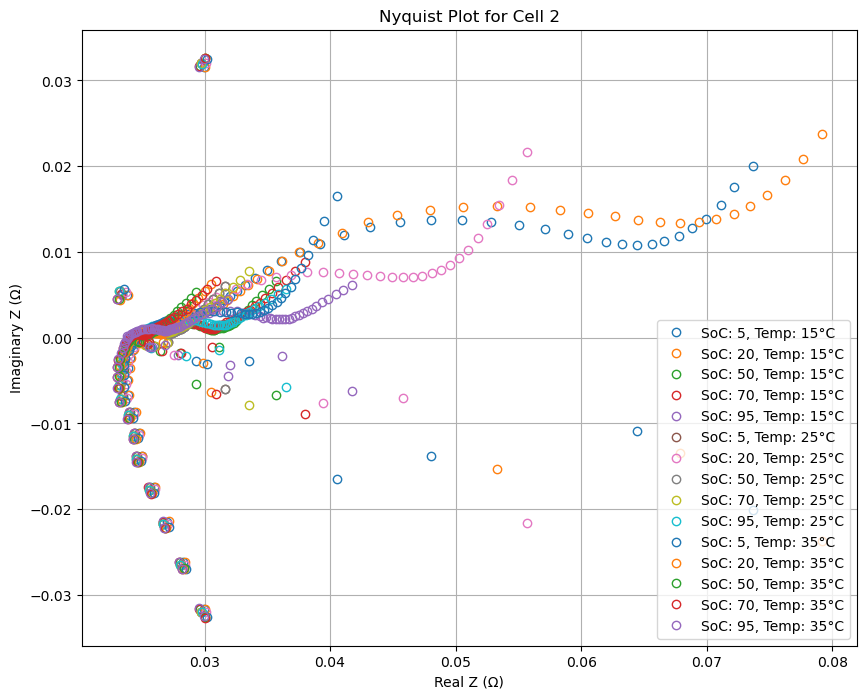

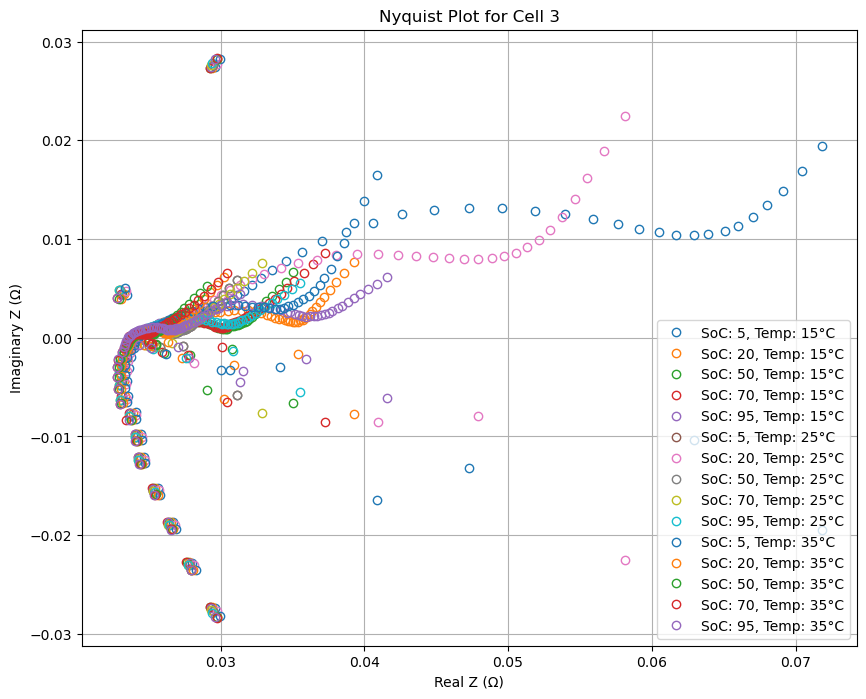

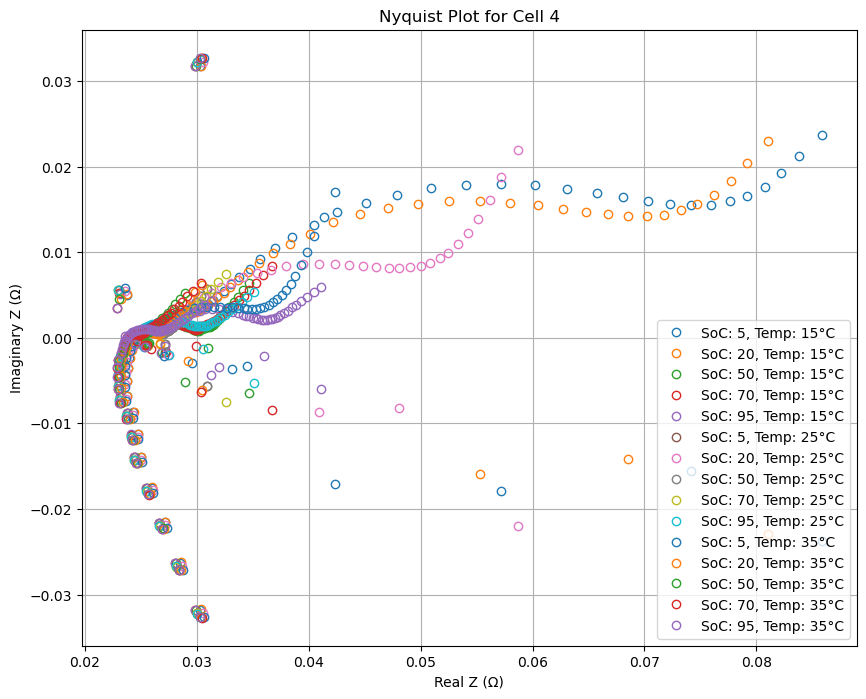

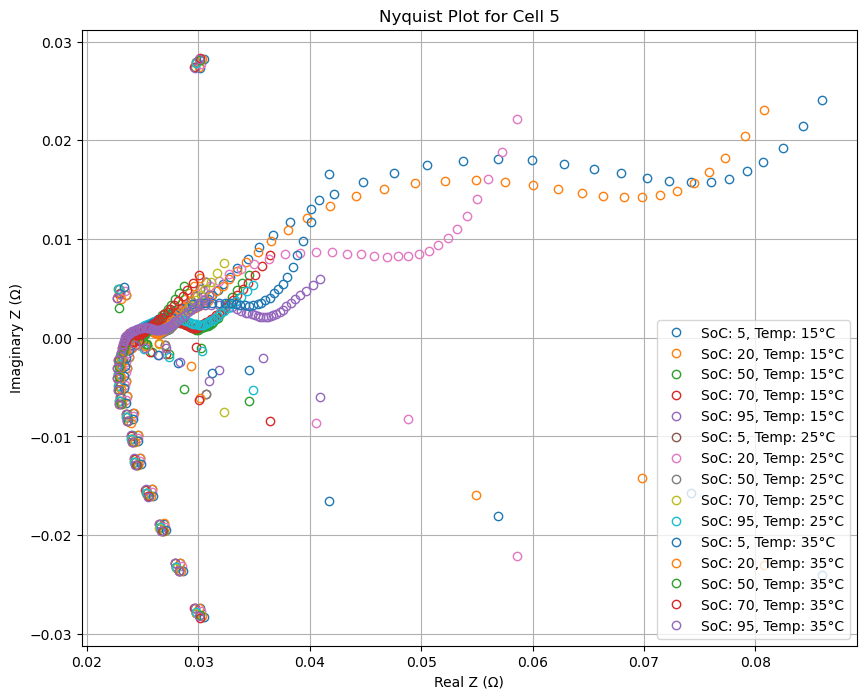

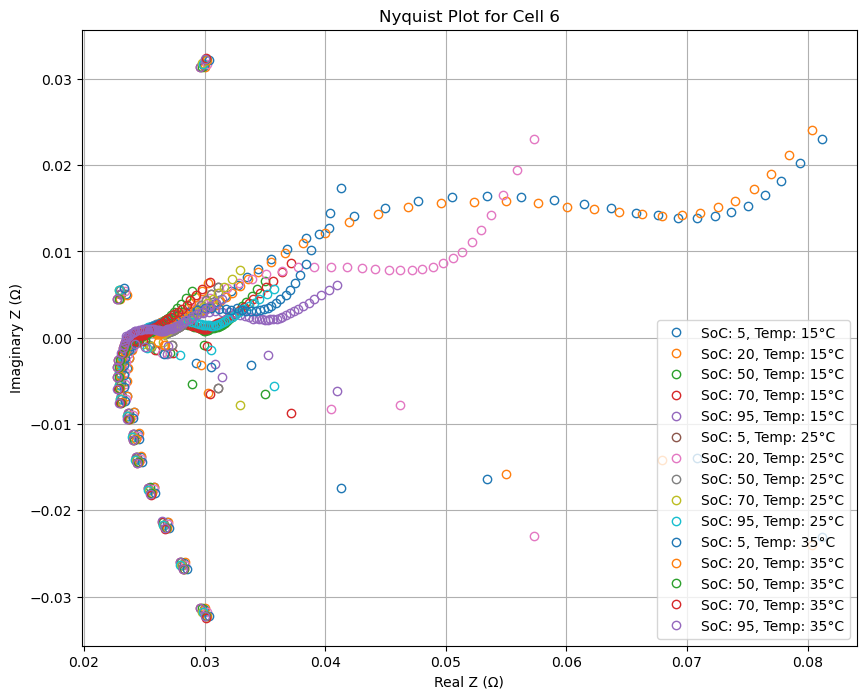

...

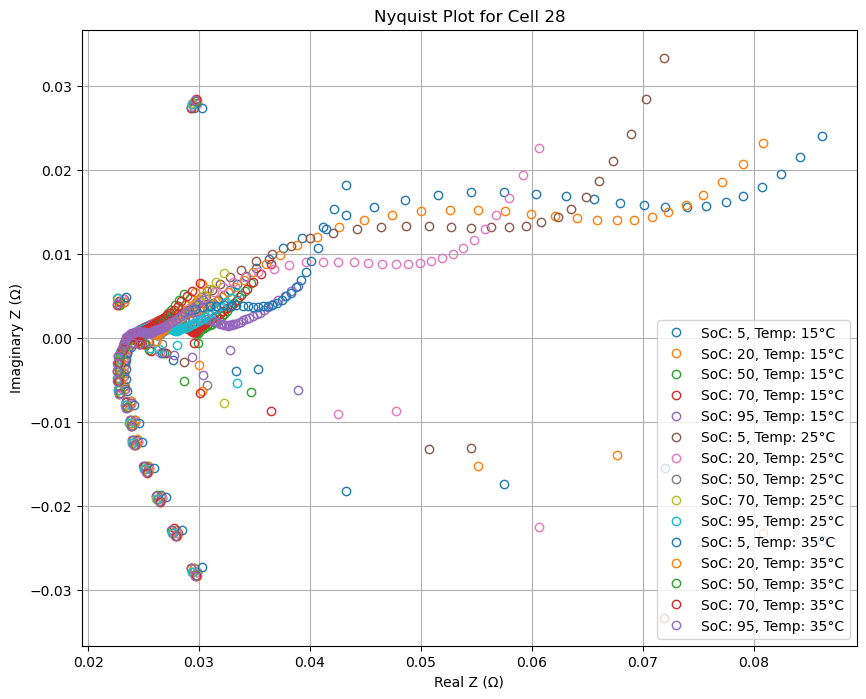

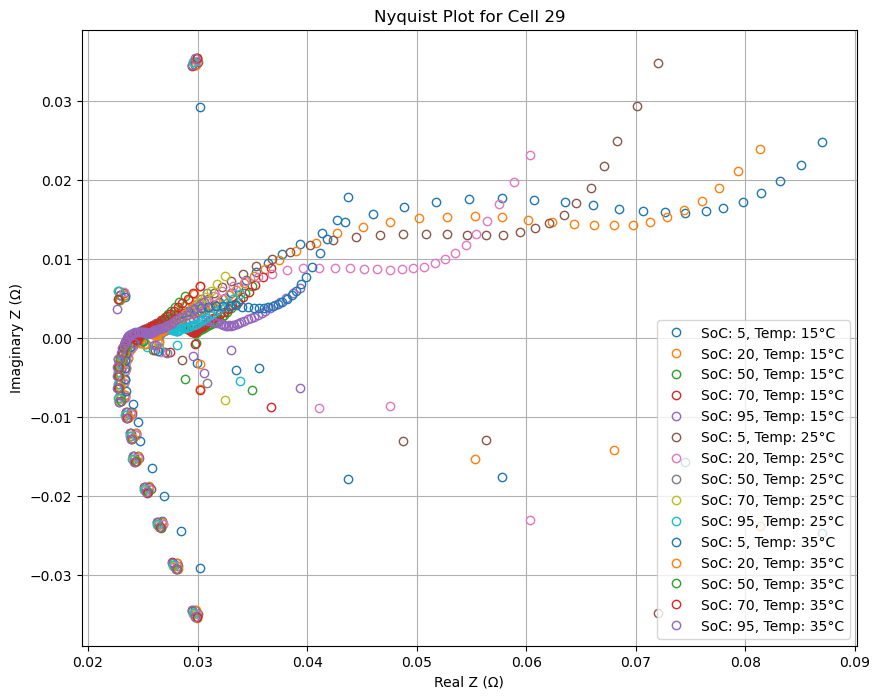

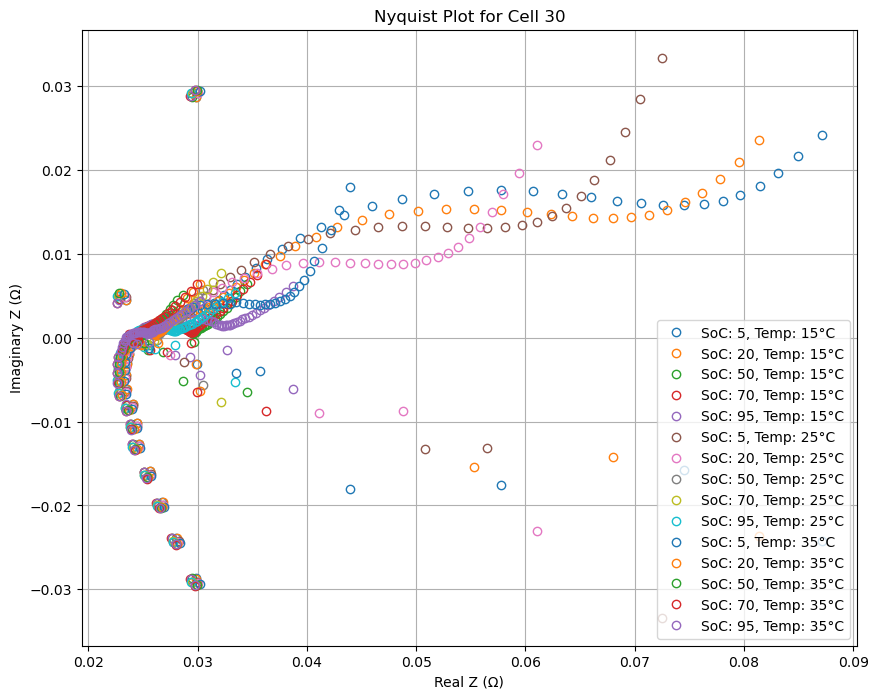

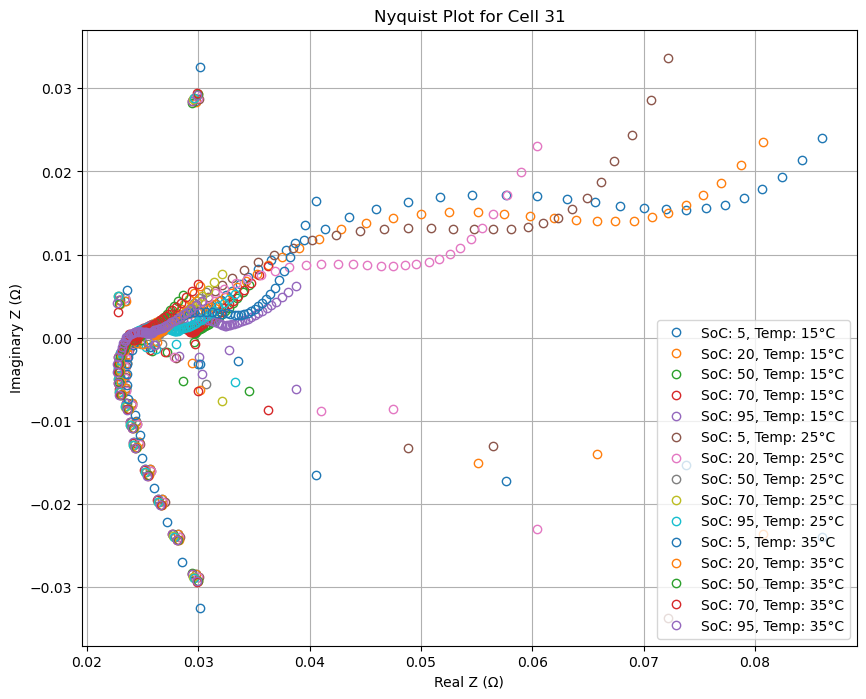

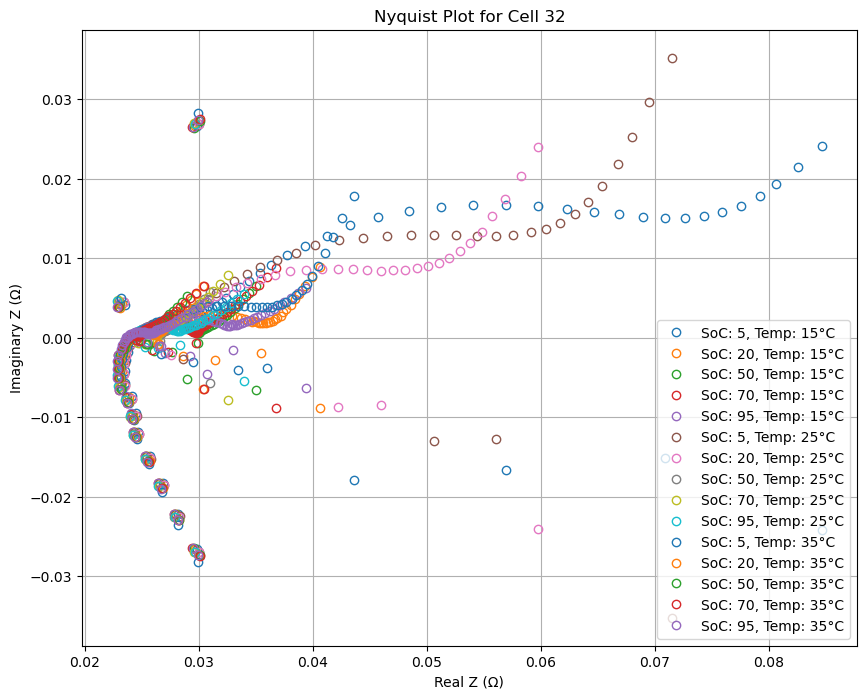

In [ ]:
# Nyquist Plot 생성 코드
# Step 5: Nyquist Plot for Each Cell

# 주파수별 Real, Imaginary 컬럼 식별
real_z_columns = [col for col in raw_data.columns if col.startswith('Fx')]
imag_z_columns = [col for col in raw_data.columns if col.startswith('Fy')]

# 필요한 데이터만 필터링
filtered_data = raw_data[['Cell_Name', 'Temp', 'SoC', 'SoH_Actual'] + real_z_columns + imag_z_columns]
unique_cells = filtered_data['Cell_Name'].unique()

# Cell별 모든 SoC와 Temp 조건에 대해 Nyquist Plot 생성
for cell in unique_cells:
    cell_data = filtered_data[filtered_data['Cell_Name'] == cell]
    plt.figure(figsize=(10, 8))
    for temp in cell_data['Temp'].unique():
        for soc in cell_data['SoC'].unique():
            subset = cell_data[(cell_data['SoC'] == soc) & (cell_data['Temp'] == temp)]
            if not subset.empty:
                real_z_values = subset[real_z_columns].values.flatten()
                imag_z_values = -subset[imag_z_columns].values.flatten()  # Nyquist plot 관습에 따라 음수 처리
                plt.plot(real_z_values, imag_z_values, 'o', label=f'SoC: {soc}, Temp: {temp}°C', markerfacecolor='none')

    plt.xlabel('Real Z (Ω)')
    plt.ylabel('Imaginary Z (Ω)')
    plt.title(f'Nyquist Plot for Cell {cell}')
    plt.legend()
    plt.grid(True)
    plt.show()





# SOC=50

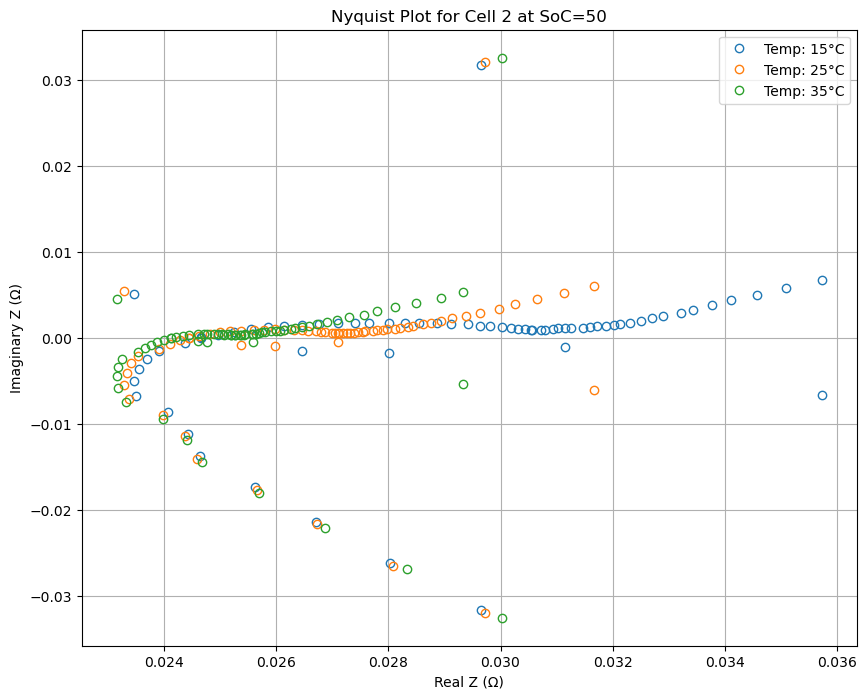

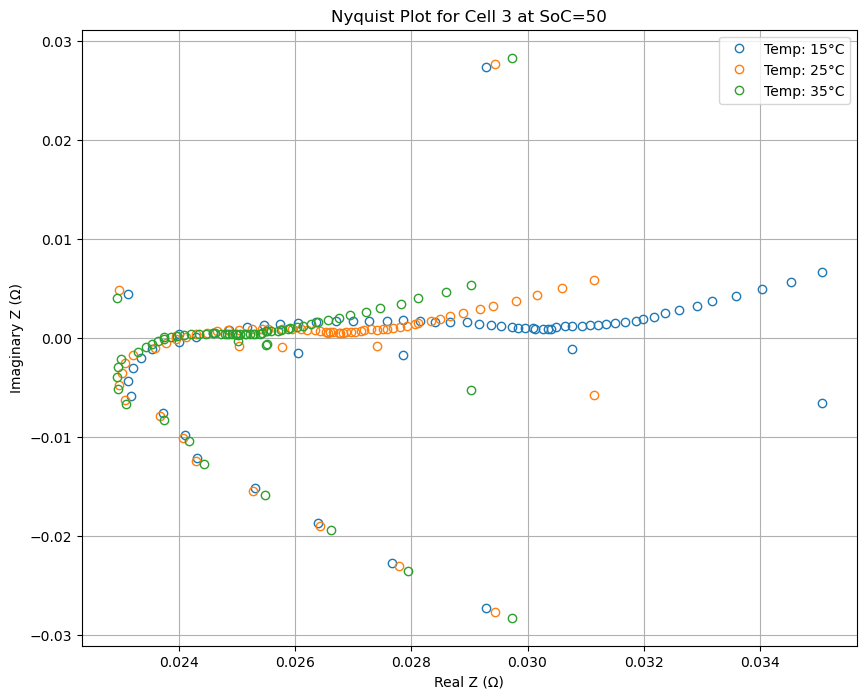

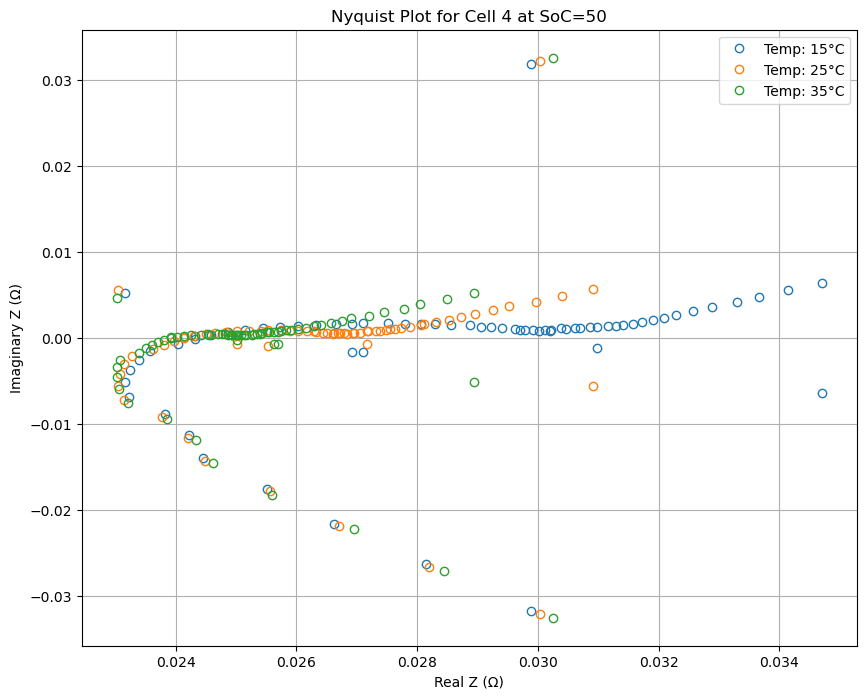

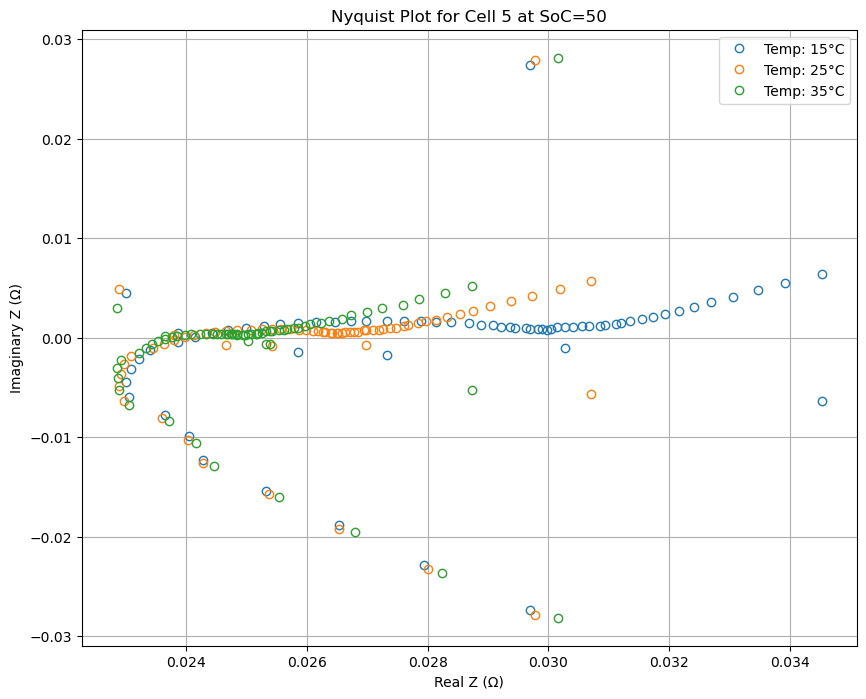

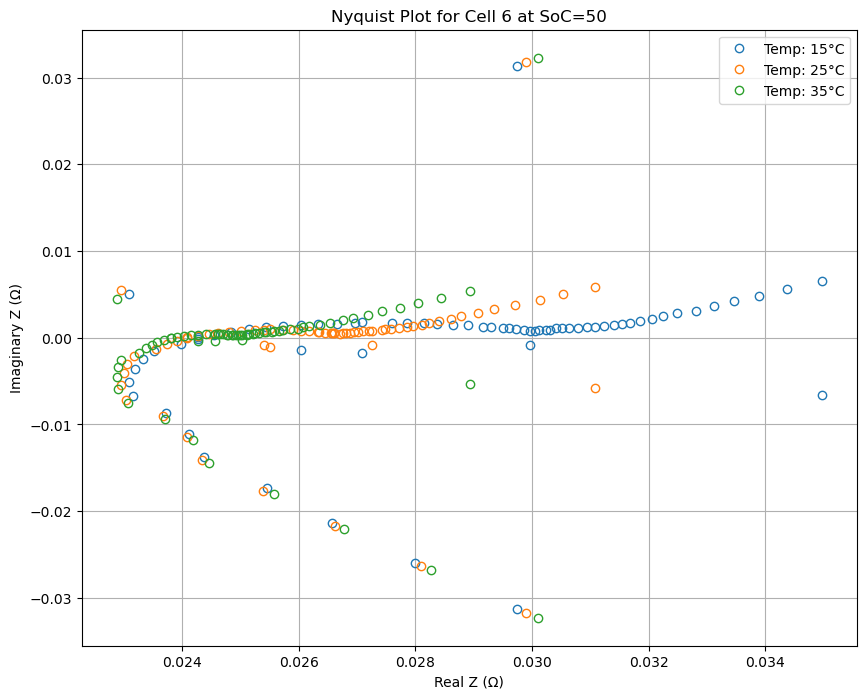

...

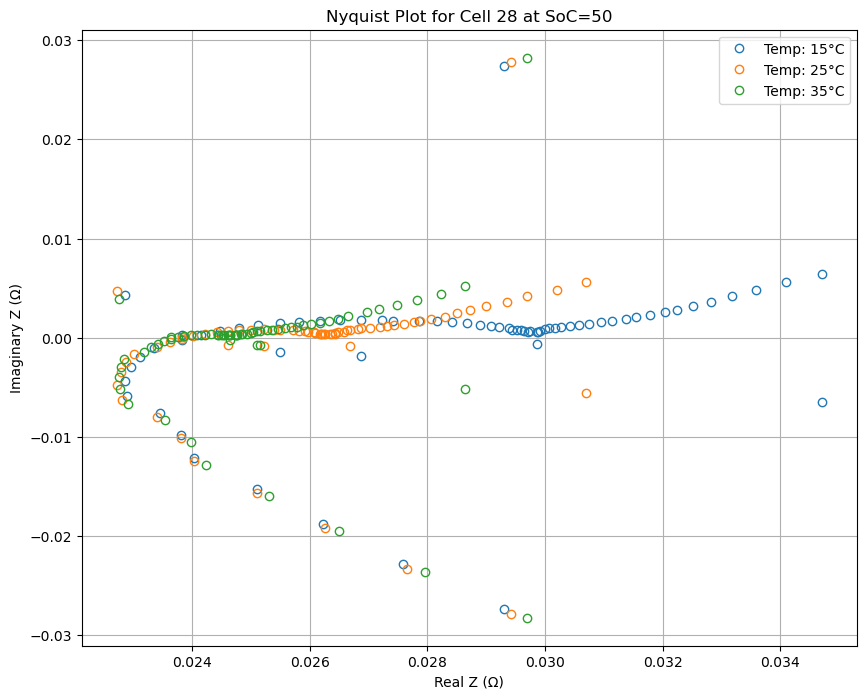

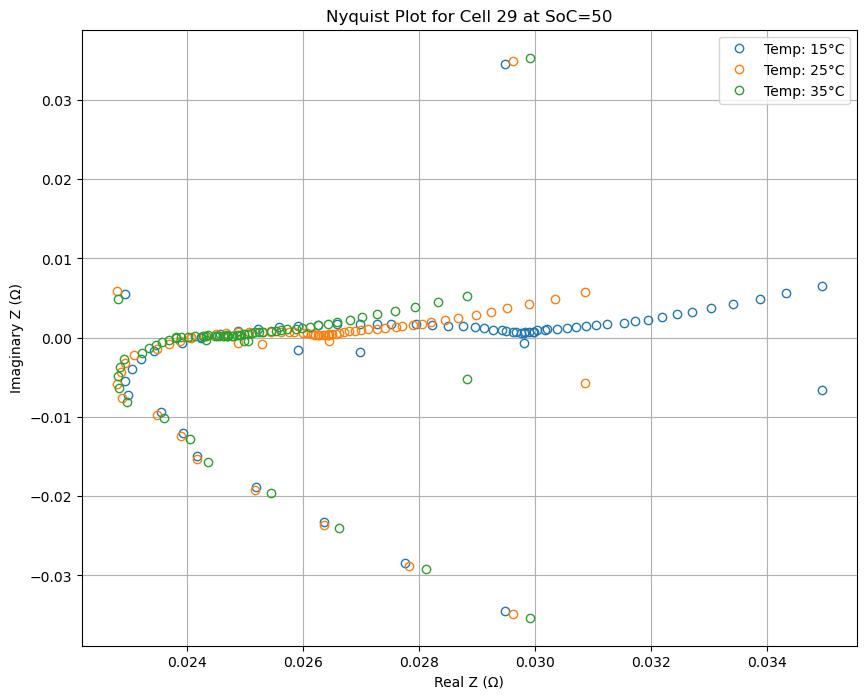

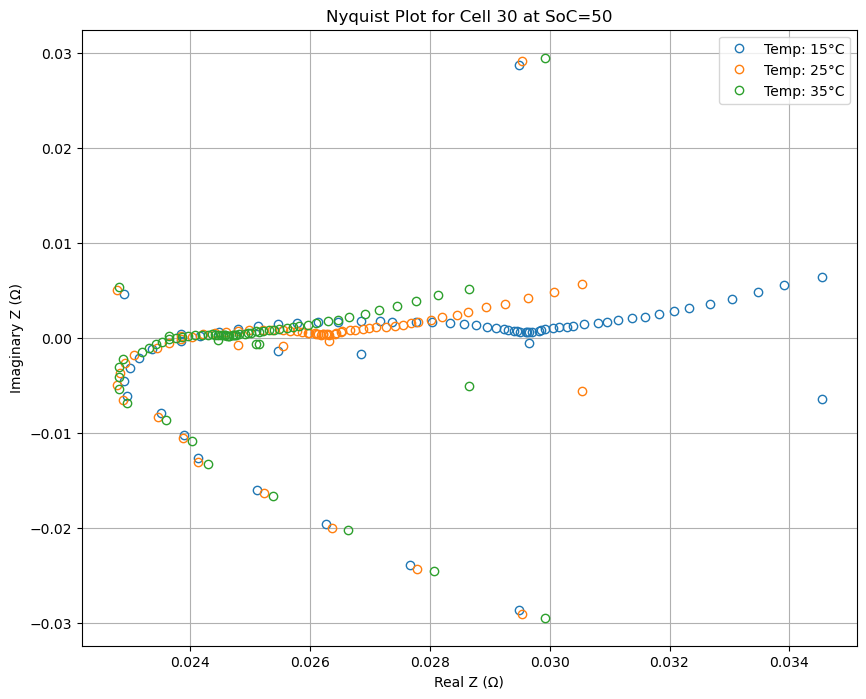

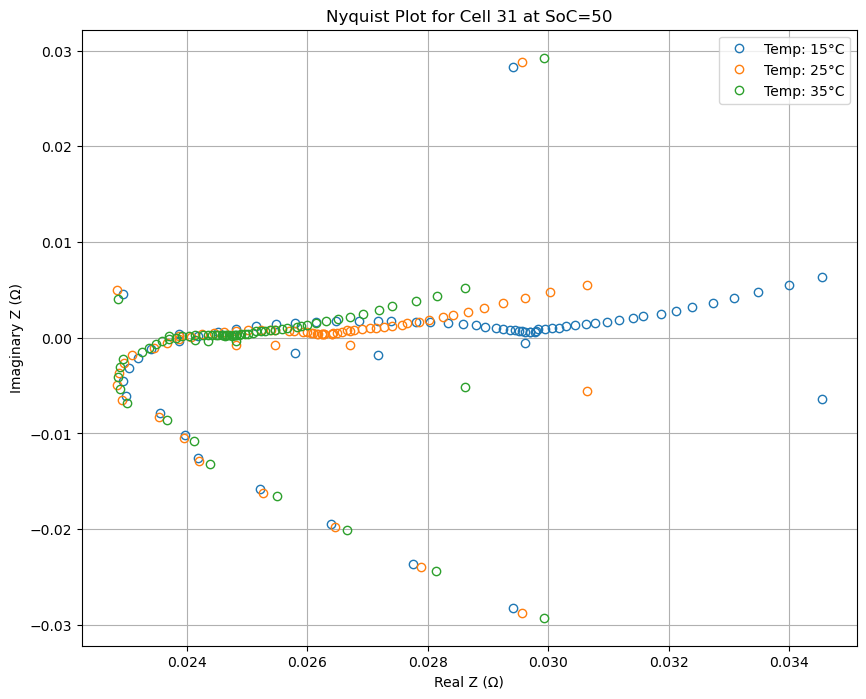

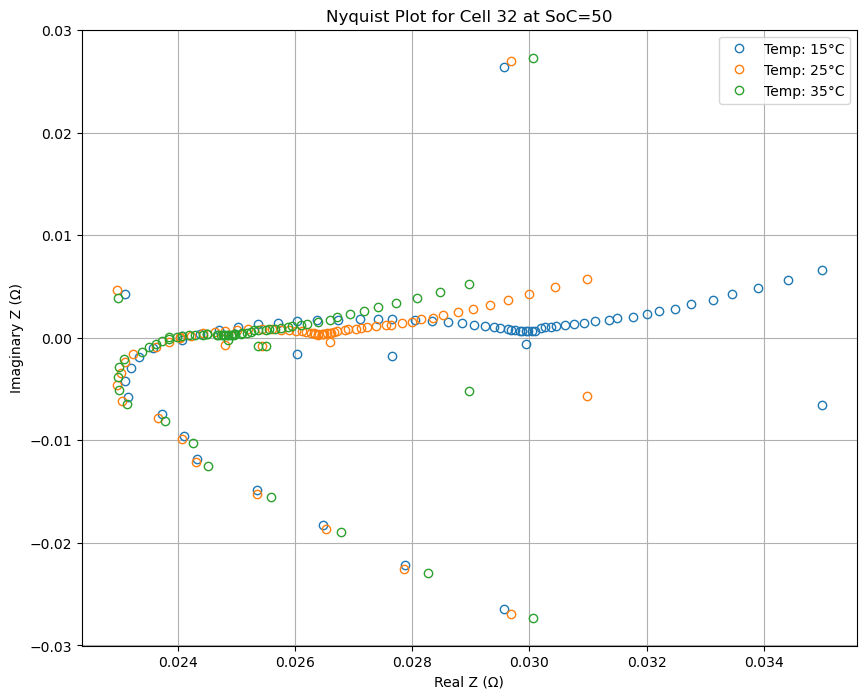

In [ ]:
import matplotlib.pyplot as plt

# 주파수별 Real, Imaginary 컬럼 식별
real_z_columns = [col for col in raw_data.columns if col.startswith('Fx')]
imag_z_columns = [col for col in raw_data.columns if col.startswith('Fy')]

# 필요한 데이터만 필터링
filtered_data = raw_data[['Cell_Name', 'Temp', 'SoC', 'SoH_Actual'] + real_z_columns + imag_z_columns]
unique_cells = filtered_data['Cell_Name'].unique()

# 첫 번째 조건: SoC=50으로 고정하고 온도별로 Nyquist Plot
for cell in unique_cells:
    cell_data = filtered_data[filtered_data['Cell_Name'] == cell]
    plt.figure(figsize=(10, 8))
    for temp in cell_data['Temp'].unique():
        subset = cell_data[(cell_data['SoC'] == 50) & (cell_data['Temp'] == temp)]
        if not subset.empty:
            real_z_values = subset[real_z_columns].values.flatten()
            imag_z_values = -subset[imag_z_columns].values.flatten()
            plt.plot(real_z_values, imag_z_values, 'o', label=f'Temp: {temp}°C', markerfacecolor='none')
            
    plt.xlabel('Real Z (Ω)')
    plt.ylabel('Imaginary Z (Ω)')
    plt.title(f'Nyquist Plot for Cell {cell} at SoC=50')
    plt.legend()
    plt.grid(True)
    plt.show()


# Temp=25

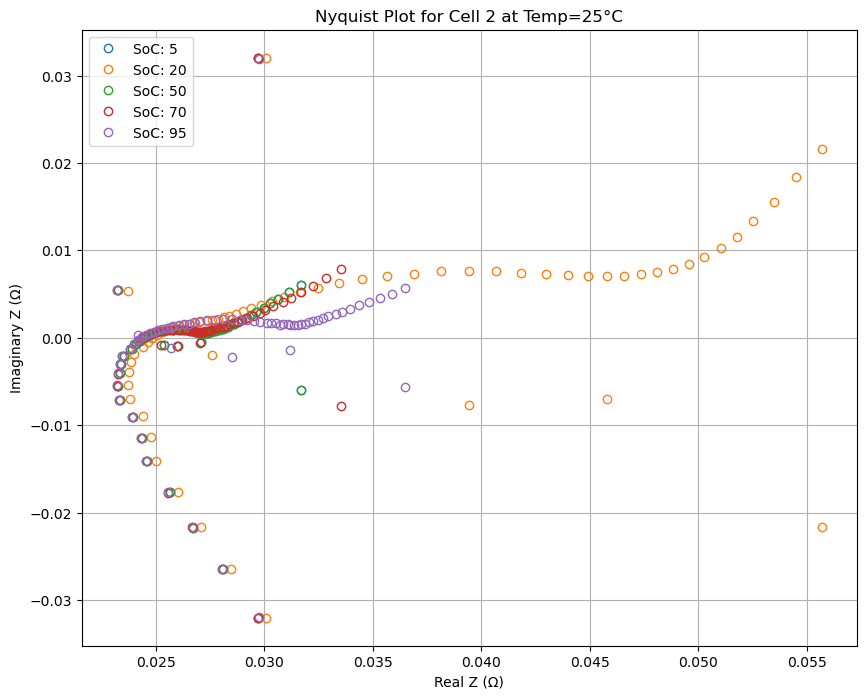

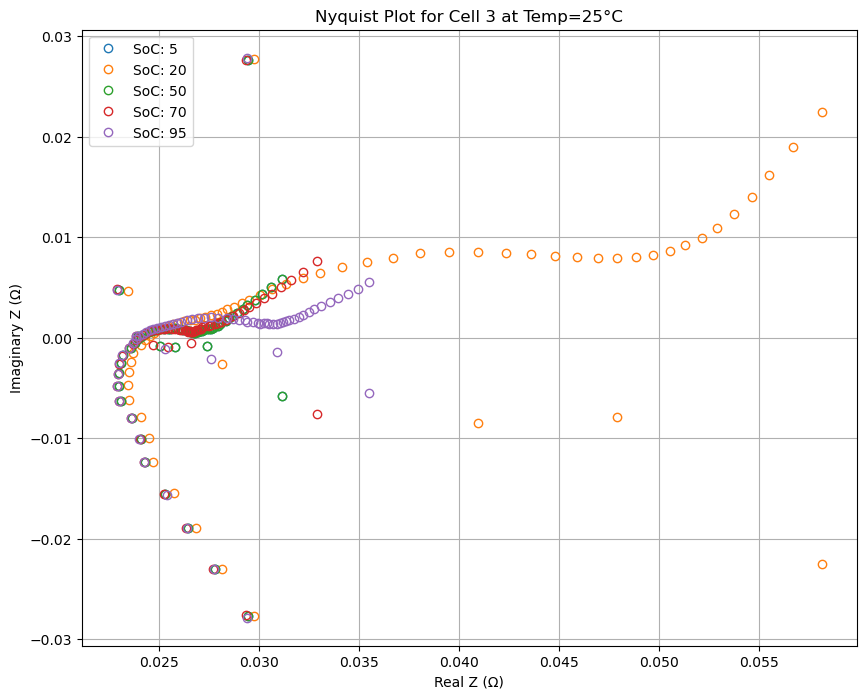

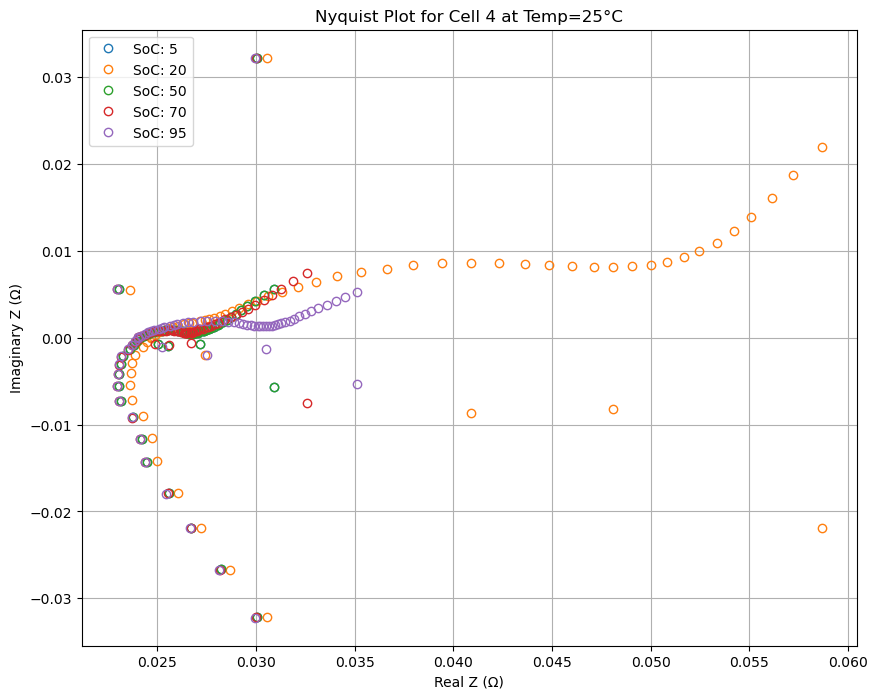

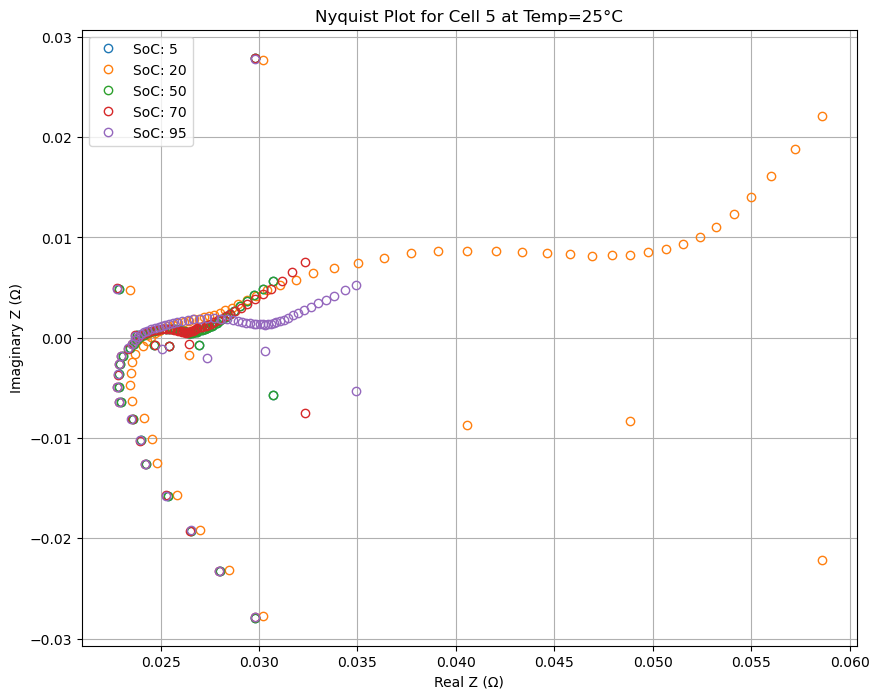

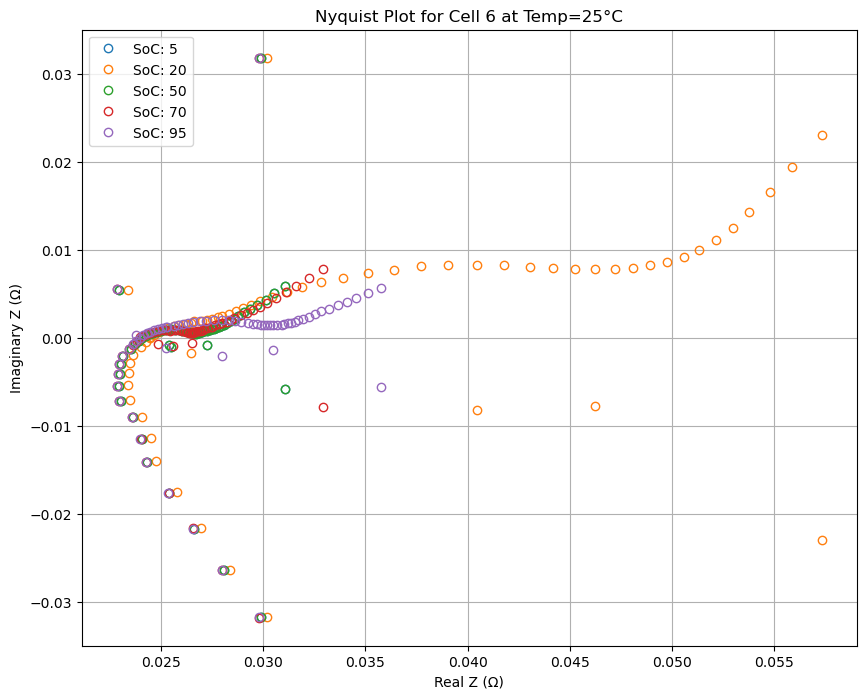

...

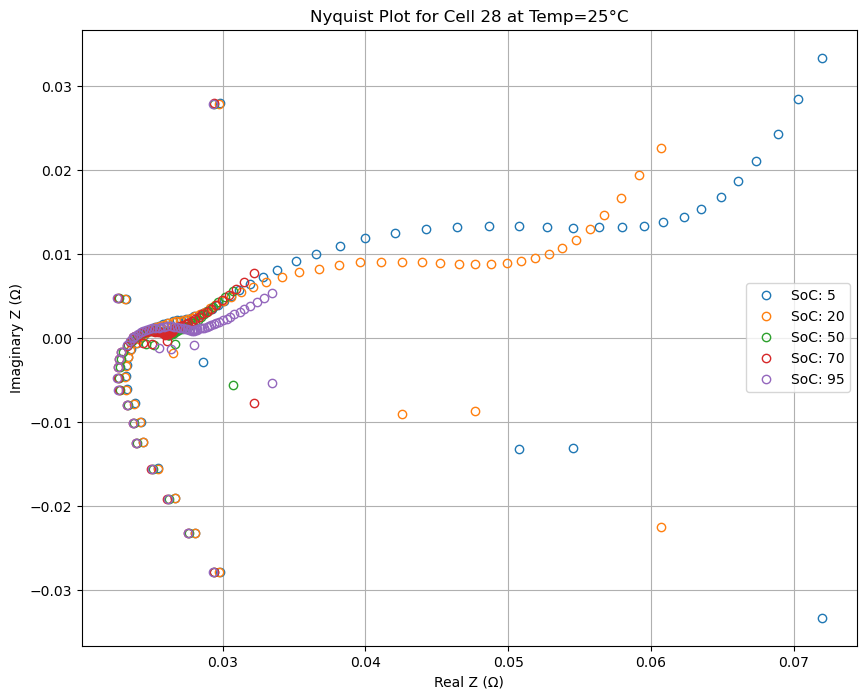

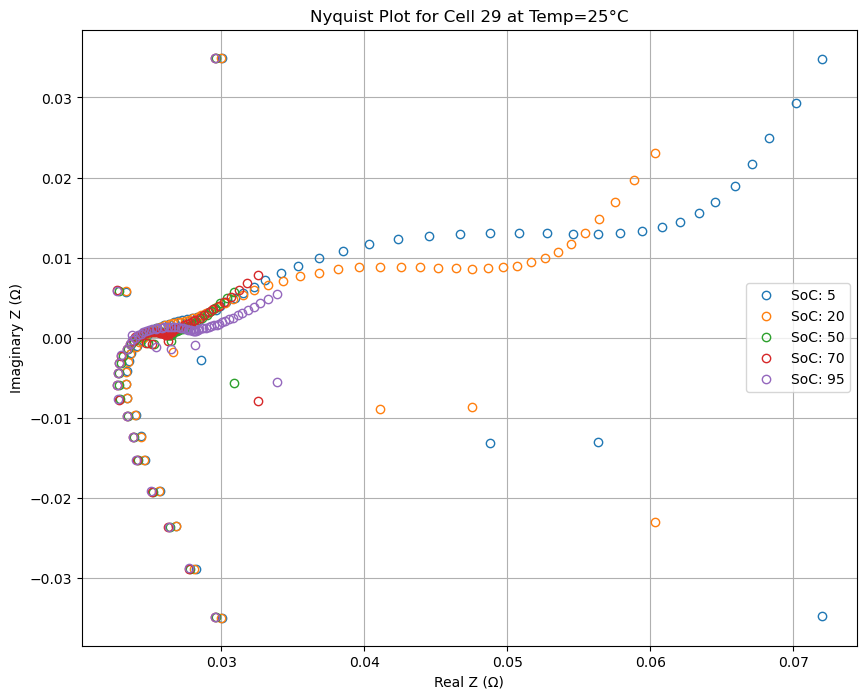

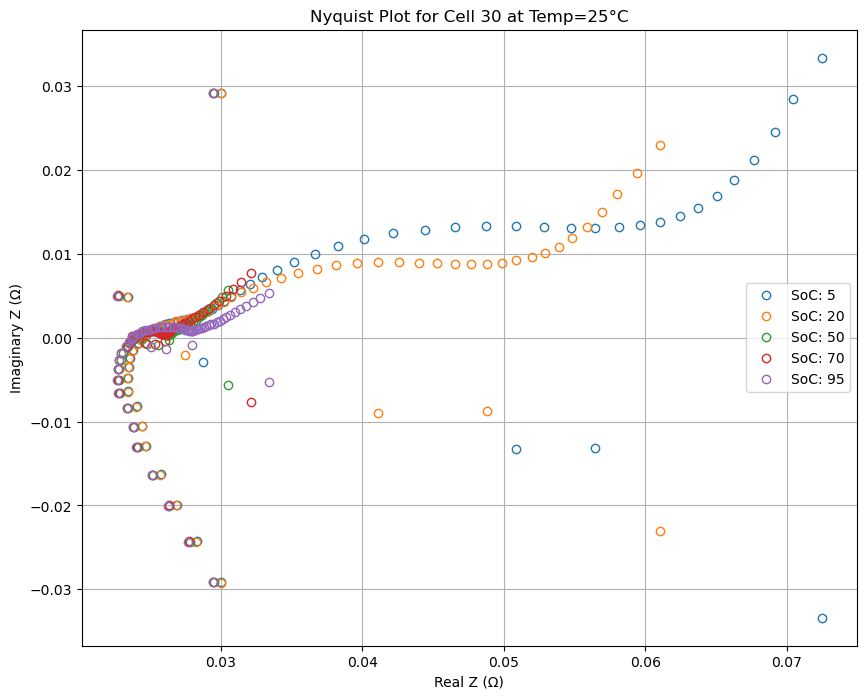

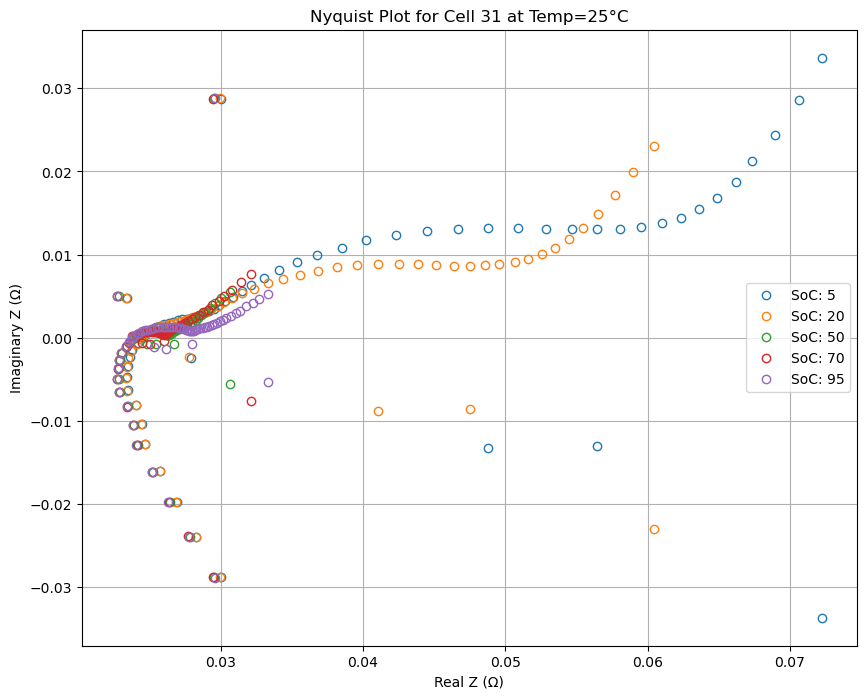

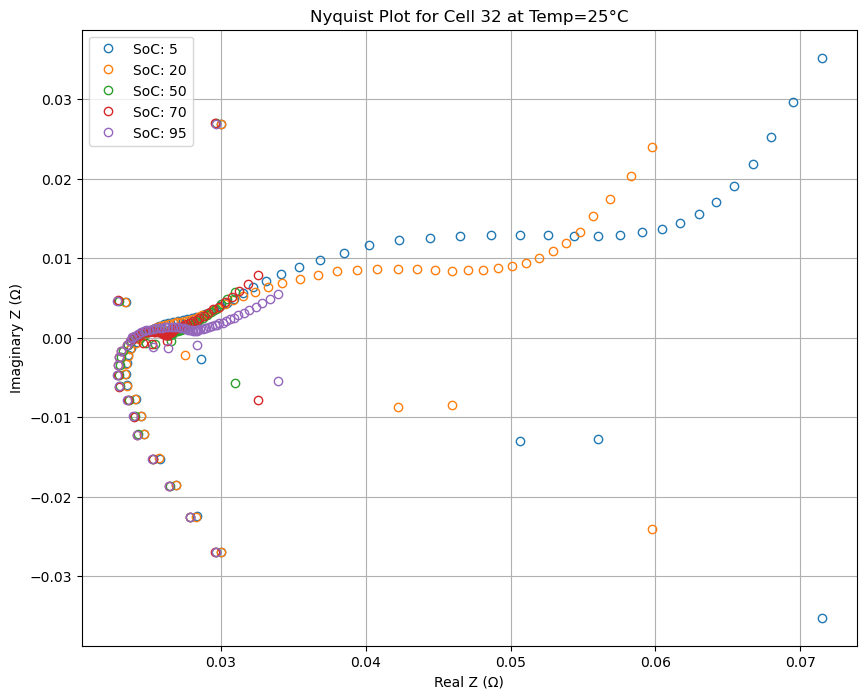

In [7]:
# 두 번째 조건: Temp=25로 고정하고 SoC별로 Nyquist Plot
for cell in unique_cells:
    cell_data = filtered_data[filtered_data['Cell_Name'] == cell]
    plt.figure(figsize=(10, 8))
    for soc in cell_data['SoC'].unique():
        subset = cell_data[(cell_data['SoC'] == soc) & (cell_data['Temp'] == 25)]
        if not subset.empty:
            real_z_values = subset[real_z_columns].values.flatten()
            imag_z_values = -subset[imag_z_columns].values.flatten()
            plt.plot(real_z_values, imag_z_values, 'o', label=f'SoC: {soc}', markerfacecolor='none')
            
    plt.xlabel('Real Z (Ω)')
    plt.ylabel('Imaginary Z (Ω)')
    plt.title(f'Nyquist Plot for Cell {cell} at Temp=25°C')
    plt.legend()
    plt.grid(True)
    plt.show()

# SOC=50 and Temp=25

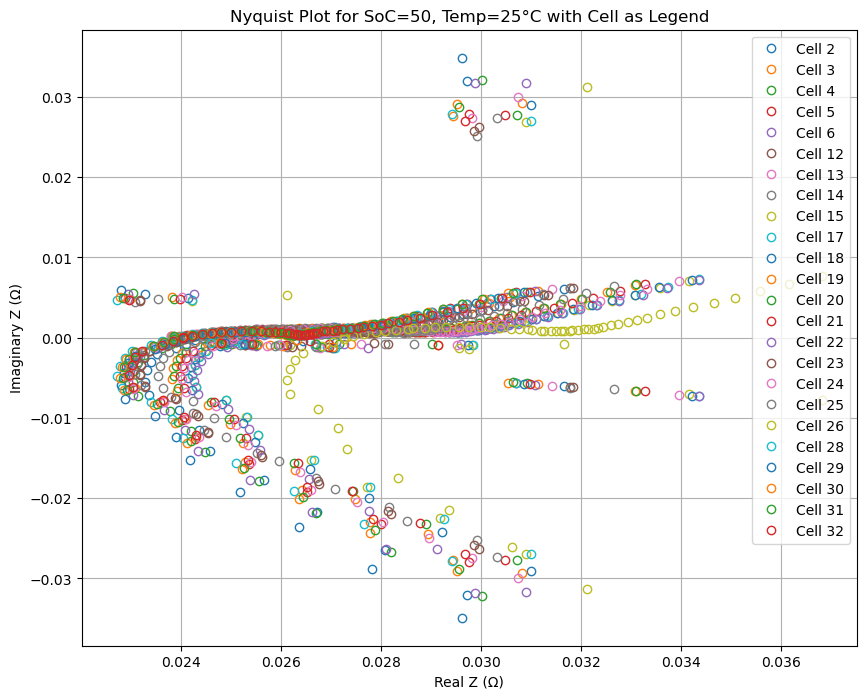

In [ ]:
import matplotlib.pyplot as plt

# 주파수별 Real, Imaginary 컬럼 식별
real_z_columns = [col for col in raw_data.columns if col.startswith('Fx')]
imag_z_columns = [col for col in raw_data.columns if col.startswith('Fy')]

# 필요한 데이터만 필터링
filtered_data = data1[['Cell_Name', 'Temp', 'SoC', 'SoH_Actual'] + real_z_columns + imag_z_columns]
unique_cells = filtered_data['Cell_Name'].unique()

# SoC=50, Temp=25로 고정하여 Cell별로 Nyquist Plot을 생성
plt.figure(figsize=(10, 8))
for cell in unique_cells:
    # 특정 Cell의 데이터 중 SoC=50, Temp=25 조건에 맞는 데이터 선택
    subset = filtered_data[(filtered_data['Cell_Name'] == cell) & (filtered_data['SoC'] == 50) & (filtered_data['Temp'] == 25)]
    if not subset.empty:
        real_z_values = subset[real_z_columns].values.flatten()
        imag_z_values = -subset[imag_z_columns].values.flatten()  # Nyquist plot 관습에 따라 음수 처리
        plt.plot(real_z_values, imag_z_values, 'o', label=f'Cell {cell}', markerfacecolor='none')

plt.xlabel('Real Z (Ω)')
plt.ylabel('Imaginary Z (Ω)')
plt.title('Nyquist Plot for SoC=50, Temp=25°C with Cell as Legend')
plt.legend()
plt.grid(True)
plt.show()


# Data Preprocessing
- 주파수 범위 제한 (10Hz ~ 1kHz)

In [ ]:
# Step 6: Data Filtering for Correlation Analysis
filtered_real_columns = []
filtered_imag_columns = []
for col in raw_data.columns:
    if col.startswith('Fx') or col.startswith('Fy'):
        try:
            freq = float(col[2:])
            if 10 <= freq <= 1000:
                if col.startswith('Fx'):
                    filtered_real_columns.append(col)
                elif col.startswith('Fy'):
                    filtered_imag_columns.append(col)
        except ValueError:
            continue



# Correlation Analysis and Visualization
- SOH, SOC, Temperature와 Impedance 간의 상관관계 분석

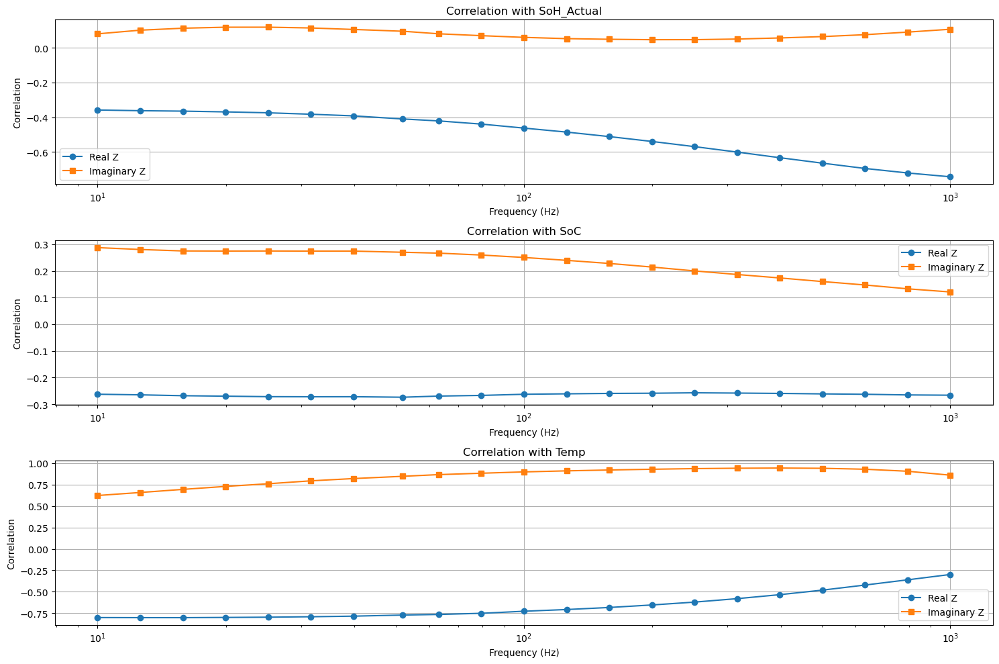

In [ ]:
# Step 7: Correlation Analysis and Visualization
correlation_data = raw_data[['SoH_Actual', 'SoC', 'Temp'] + filtered_real_columns + filtered_imag_columns]
correlation_matrix = correlation_data.corr()
correlation_with_target = correlation_matrix.loc[['SoH_Actual', 'SoC', 'Temp'], filtered_real_columns + filtered_imag_columns]

frequencies = np.array([float(col[2:]) for col in filtered_real_columns])
correlation_soh = correlation_with_target.loc['SoH_Actual'].values
correlation_soc = correlation_with_target.loc['SoC'].values
correlation_temp = correlation_with_target.loc['Temp'].values

plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
plt.semilogx(frequencies, correlation_soh[:len(filtered_real_columns)], 'o-', label='Real Z')
plt.semilogx(frequencies, correlation_soh[len(filtered_real_columns):], 's-', label='Imaginary Z')
plt.title('Correlation with SoH_Actual')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Correlation')
plt.legend()
plt.grid(True)

plt.subplot(3, 1, 2)
plt.semilogx(frequencies, correlation_soc[:len(filtered_real_columns)], 'o-', label='Real Z')
plt.semilogx(frequencies, correlation_soc[len(filtered_real_columns):], 's-', label='Imaginary Z')
plt.title('Correlation with SoC')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Correlation')
plt.legend()
plt.grid(True)

plt.subplot(3, 1, 3)
plt.semilogx(frequencies, correlation_temp[:len(filtered_real_columns)], 'o-', label='Real Z')
plt.semilogx(frequencies, correlation_temp[len(filtered_real_columns):], 's-', label='Imaginary Z')
plt.title('Correlation with Temp')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Correlation')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()



# Data Distribution

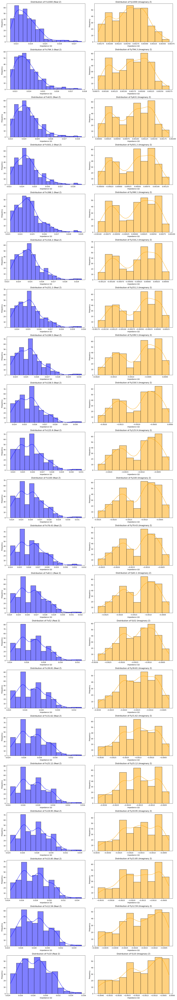

In [ ]:
# Step 8: Data Distribution Visualization
num_plots = max(len(filtered_real_columns), len(filtered_imag_columns))
plt.figure(figsize=(15, num_plots * 4))
for i, col in enumerate(filtered_real_columns, 1):
    plt.subplot(num_plots, 2, i * 2 - 1)
    sns.histplot(raw_data[col], kde=True, color='blue')
    plt.title(f'Distribution of {col} (Real Z)')
    plt.xlabel('Impedance (Ω)')
    plt.ylabel('Frequency')
for i, col in enumerate(filtered_imag_columns, 1):
    plt.subplot(num_plots, 2, i * 2)
    sns.histplot(raw_data[col], kde=True, color='orange')
    plt.title(f'Distribution of {col} (Imaginary Z)')
    plt.xlabel('Impedance (Ω)')
    plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

# Data Filtering 
- 특정 주파수만 사용 ex) 500, 250, 100, 10Hz

# Model Training
- Fully Connected Neural Network (FC-NN) 정의

In [ ]:
from model_FCNN_241106 import NeuralNetwork
# Model Description 필요함

# Model Prediction and Results Visualization
- 모델 학습
- 모델 예측 및 실제 값과 비교 시각화

Epoch 0, MSE Loss: 0.4798
Epoch 1000, MSE Loss: 0.1306
Epoch 2000, MSE Loss: 0.0797
Epoch 3000, MSE Loss: 0.0536
Epoch 4000, MSE Loss: 0.0354
Epoch 5000, MSE Loss: 0.0241
Epoch 6000, MSE Loss: 0.0178
Epoch 7000, MSE Loss: 0.0144
Epoch 8000, MSE Loss: 0.0125
Epoch 9000, MSE Loss: 0.0115
   Actual Capacity (SoH_Actual)  Predicted Capacity
0                        100.00           96.680152
1                         80.46           80.021075
2                         87.49           88.850269
3                         86.41           85.631431
4                        100.00           96.824957
5                         80.60           62.525932
6                         90.37           93.532463
7                         95.05           92.168555


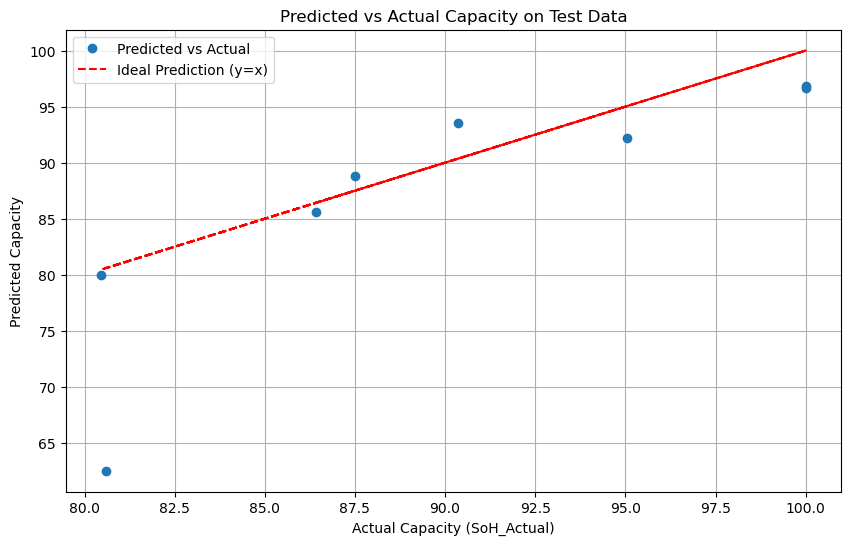

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from model_FCNN_241106 import NeuralNetwork

# Step 1: Filtering data for specific conditions
# Defining target and selected frequency columns
freq_columns_updated = ['Fx501.2', 'Fx251.2', 'Fx100', 'Fx10']
target_column = 'SoH_Actual'

# Filtering data to include only specified SoC, Temp, and frequency columns
filtered_data = raw_data[(raw_data['Temp'] == 25) & (raw_data['SoC'] == 50)]
filtered_data = filtered_data[['Cell_Name'] + freq_columns_updated + [target_column]]

# Step 2: Splitting data by Cell_Name and creating train/test sets
cell_dataframes = {cell: filtered_data[filtered_data['Cell_Name'] == cell] for cell in range(2, 33)}
cell_names = list(cell_dataframes.keys())
train_cells, test_cells = train_test_split(cell_names, test_size=0.3, random_state=42)

train_data = pd.concat([cell_dataframes[cell] for cell in train_cells])
test_data = pd.concat([cell_dataframes[cell] for cell in test_cells])

# Extracting features (X) and target (y) for training and testing
X_train = train_data[freq_columns_updated].values
y_train = train_data[target_column].values.reshape(-1, 1)
X_test = test_data[freq_columns_updated].values
y_test = test_data[target_column].values.reshape(-1, 1)

# Step 3: Data normalization
scaler_X = MinMaxScaler()
scaler_y = MinMaxScaler()

X_train_normalized = scaler_X.fit_transform(X_train)
y_train_normalized = scaler_y.fit_transform(y_train)
X_test_normalized = scaler_X.transform(X_test)
y_test_normalized = scaler_y.transform(y_test)

# Step 4: Define and train the neural network
nn_final_updated = NeuralNetwork(input_size=4, hidden_size1=3, hidden_size2=2, output_size=1)
nn_final_updated.train(X_train_normalized, y_train_normalized, epochs=10000)

# Step 5: Predicting on test data
predictions_test_normalized = nn_final_updated.forward(X_test_normalized)
predictions_test_original_scale = scaler_y.inverse_transform(predictions_test_normalized)

# Creating a DataFrame with actual and predicted values
predictions_df = pd.DataFrame({
    'Actual Capacity (SoH_Actual)': y_test.flatten(),
    'Predicted Capacity': predictions_test_original_scale.flatten()
})
print(predictions_df)

# Step 6: Plotting Actual vs Predicted values
plt.figure(figsize=(10, 6))
plt.plot(y_test, predictions_test_original_scale, 'o', label="Predicted vs Actual")
plt.plot(y_test, y_test, 'r--', label="Ideal Prediction (y=x)")
plt.xlabel("Actual Capacity (SoH_Actual)")
plt.ylabel("Predicted Capacity")
plt.title("Predicted vs Actual Capacity on Test Data")
plt.legend()
plt.grid(True)
plt.show()

# Error Analysis
- Error가 큰 지점의 Data 확인

In [ ]:
# Test 데이터의 Cell Name과 입력 값(Fx) 컬럼을 포함하여 DataFrame 생성
predictions_df = pd.DataFrame({
    'Cell_Name': test_data['Cell_Name'].values,
    'Fx501.2': X_test[:, 0],
    'Fx251.2': X_test[:, 1],
    'Fx100': X_test[:, 2],
    'Fx10': X_test[:, 3],
    'Actual Capacity (SoH_Actual)': y_test.flatten(),
    'Predicted Capacity': predictions_test_original_scale.flatten()
})

# 결과 출력 (상위 10개 행)
print(predictions_df.head(10))


   Cell_Name  Fx501.2  Fx251.2    Fx100     Fx10  \
0         29  0.02369  0.02429  0.02508  0.02622   
1         17  0.02508  0.02564  0.02647  0.02854   
2         25  0.02429  0.02478  0.02548  0.02740   
3         19  0.02457  0.02507  0.02581  0.02783   
4         31  0.02367  0.02425  0.02501  0.02616   
5         26  0.02705  0.02767  0.02855  0.03060   
6         14  0.02381  0.02430  0.02498  0.02681   
7          2  0.02410  0.02462  0.02537  0.02687   

   Actual Capacity (SoH_Actual)  Predicted Capacity  
0                        100.00           96.680152  
1                         80.46           80.021075  
2                         87.49           88.850269  
3                         86.41           85.631431  
4                        100.00           96.824957  
5                         80.60           62.525932  
6                         90.37           93.532463  
7                         95.05           92.168555  


# Prediction Performamce Result 
## R2-Score, RMSE, MAE, ME

Evaluation Metrics for Test Data Predictions:
       RMSE       MAE  Max Error (ME)  R2 Score
0  6.789029  4.148829       18.074068  0.130732


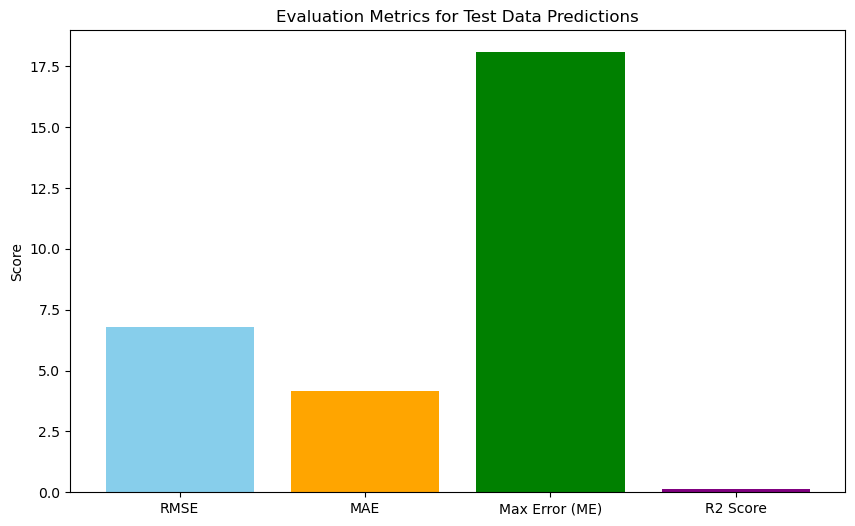

In [14]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, max_error, r2_score
import matplotlib.pyplot as plt
import numpy as np

# Step 7: Calculating Evaluation Metrics
rmse = np.sqrt(mean_squared_error(y_test, predictions_test_original_scale))
mae = mean_absolute_error(y_test, predictions_test_original_scale)
me = max_error(y_test, predictions_test_original_scale)
r2 = r2_score(y_test, predictions_test_original_scale)

# Creating a DataFrame to display the metrics
metrics_df = pd.DataFrame({
    'RMSE': [rmse],
    'MAE': [mae],
    'Max Error (ME)': [me],
    'R2 Score': [r2]
})

# Displaying the metrics DataFrame
print("Evaluation Metrics for Test Data Predictions:")
print(metrics_df)

# Step 8: Plotting Evaluation Metrics
# Defining a figure for metric visualization
plt.figure(figsize=(10, 6))

# Plotting RMSE, MAE, ME, and R2 Score
metrics = ['RMSE', 'MAE', 'Max Error (ME)', 'R2 Score']
values = [rmse, mae, me, r2]
plt.bar(metrics, values, color=['skyblue', 'orange', 'green', 'purple'])

# Adding titles and labels
plt.title('Evaluation Metrics for Test Data Predictions')
plt.ylabel('Score')

# Displaying the bar plot
plt.show()

## Permutation Importance

Epoch 0, MSE Loss: 2.5782
Epoch 1000, MSE Loss: 0.2049
Epoch 2000, MSE Loss: 0.1449
Epoch 3000, MSE Loss: 0.1359
Epoch 4000, MSE Loss: 0.1334
Epoch 5000, MSE Loss: 0.1316
Epoch 6000, MSE Loss: 0.1297
Epoch 7000, MSE Loss: 0.1276
Epoch 8000, MSE Loss: 0.1252
Epoch 9000, MSE Loss: 0.1225
Epoch 10000, MSE Loss: 0.1193
Epoch 11000, MSE Loss: 0.1155
Epoch 12000, MSE Loss: 0.1110
Epoch 13000, MSE Loss: 0.1057
Epoch 14000, MSE Loss: 0.0997
Epoch 15000, MSE Loss: 0.0929
Epoch 16000, MSE Loss: 0.0853
Epoch 17000, MSE Loss: 0.0769
Epoch 18000, MSE Loss: 0.0684
Epoch 19000, MSE Loss: 0.0596


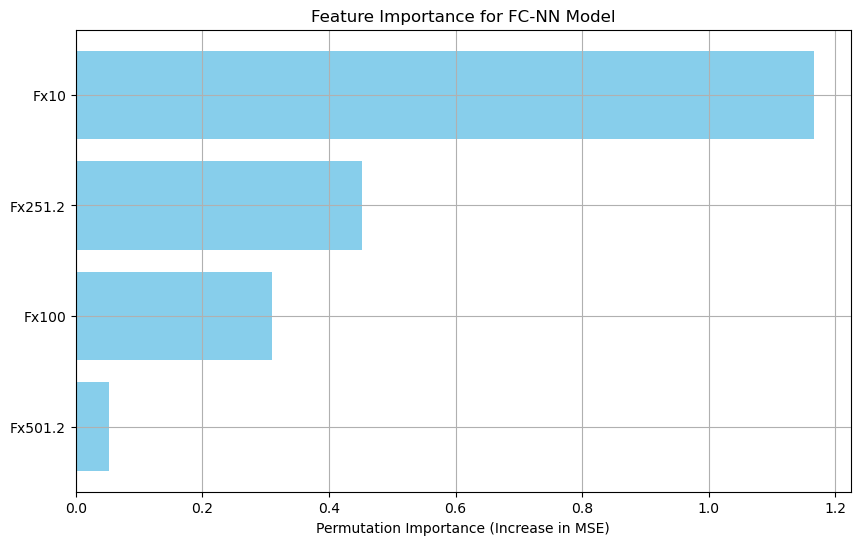

In [15]:
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Define and Train the Neural Network Model
nn_final_updated = NeuralNetwork(input_size=4, hidden_size1=3, hidden_size2=2, output_size=1)
nn_final_updated.train(X_train_normalized, y_train_normalized, epochs=20000)

# Step 2: Custom Permutation Importance Calculation
# Compute baseline prediction error
baseline_predictions = nn_final_updated.forward(X_test_normalized)
baseline_error = np.mean((y_test_normalized - baseline_predictions) ** 2)

# Calculate permutation importance for each feature
importances = []
for col in range(X_test_normalized.shape[1]):
    X_permuted = X_test_normalized.copy()
    X_permuted[:, col] = np.random.permutation(X_permuted[:, col])
    permuted_predictions = nn_final_updated.forward(X_permuted)
    permuted_error = np.mean((y_test_normalized - permuted_predictions) ** 2)
    importances.append(permuted_error - baseline_error)

# Sort and plot feature importance
sorted_idx = np.argsort(importances)

plt.figure(figsize=(10, 6))
plt.barh(np.array(freq_columns_updated)[sorted_idx], np.array(importances)[sorted_idx], color='skyblue')
plt.xlabel("Permutation Importance (Increase in MSE)")
plt.title("Feature Importance for FC-NN Model")
plt.grid(True)
plt.show()


## SHAP Result

Epoch 0, MSE Loss: 0.4664
Epoch 1000, MSE Loss: 0.0762
Epoch 2000, MSE Loss: 0.0171
Epoch 3000, MSE Loss: 0.0107
Epoch 4000, MSE Loss: 0.0093
Epoch 5000, MSE Loss: 0.0085
Epoch 6000, MSE Loss: 0.0079
Epoch 7000, MSE Loss: 0.0074
Epoch 8000, MSE Loss: 0.0071
Epoch 9000, MSE Loss: 0.0067
Epoch 10000, MSE Loss: 0.0065
Epoch 11000, MSE Loss: 0.0063
Epoch 12000, MSE Loss: 0.0061
Epoch 13000, MSE Loss: 0.0059
Epoch 14000, MSE Loss: 0.0057
Epoch 15000, MSE Loss: 0.0056
Epoch 16000, MSE Loss: 0.0055
Epoch 17000, MSE Loss: 0.0054
Epoch 18000, MSE Loss: 0.0041
Epoch 19000, MSE Loss: 0.0018


  0%|          | 0/8 [00:00<?, ?it/s]

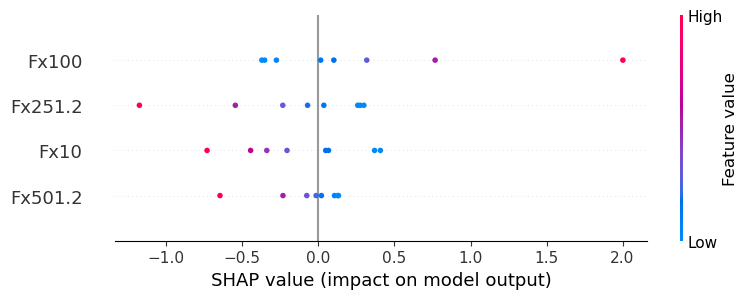

In [16]:
import shap
import numpy as np
import matplotlib.pyplot as plt

# Step 1: Define and Train the Neural Network Model
nn_final_updated = NeuralNetwork(input_size=4, hidden_size1=3, hidden_size2=2, output_size=1)
nn_final_updated.train(X_train_normalized, y_train_normalized, epochs=20000)

# Step 2: Define SHAP Explainer for the Neural Network
# Since NeuralNetwork does not have a built-in SHAP support, we use KernelExplainer with a wrapper
def model_predict(data):
    return nn_final_updated.forward(data).flatten()

# Define the SHAP explainer
explainer = shap.KernelExplainer(model_predict, X_train_normalized[:100])  # Use a subset of the data to define the explainer

# Step 3: Calculate SHAP values for the test set
shap_values = explainer.shap_values(X_test_normalized, nsamples=100)  # Compute SHAP values on a subset for speed

# Step 4: Plot SHAP Summary Plot
shap.summary_plot(shap_values, X_test_normalized, feature_names=freq_columns_updated)


# Layer Weight

Epoch 0, MSE Loss: 0.4815
Epoch 1000, MSE Loss: 0.1308
Epoch 2000, MSE Loss: 0.0690
Epoch 3000, MSE Loss: 0.0417
Epoch 4000, MSE Loss: 0.0290
Epoch 5000, MSE Loss: 0.0233
Epoch 6000, MSE Loss: 0.0209
Epoch 7000, MSE Loss: 0.0198
Epoch 8000, MSE Loss: 0.0193
Epoch 9000, MSE Loss: 0.0190
Epoch 10000, MSE Loss: 0.0189
Epoch 11000, MSE Loss: 0.0188
Epoch 12000, MSE Loss: 0.0188
Epoch 13000, MSE Loss: 0.0188
Epoch 14000, MSE Loss: 0.0188
Epoch 15000, MSE Loss: 0.0187
Epoch 16000, MSE Loss: 0.0187
Epoch 17000, MSE Loss: 0.0187
Epoch 18000, MSE Loss: 0.0187
Epoch 19000, MSE Loss: 0.0187


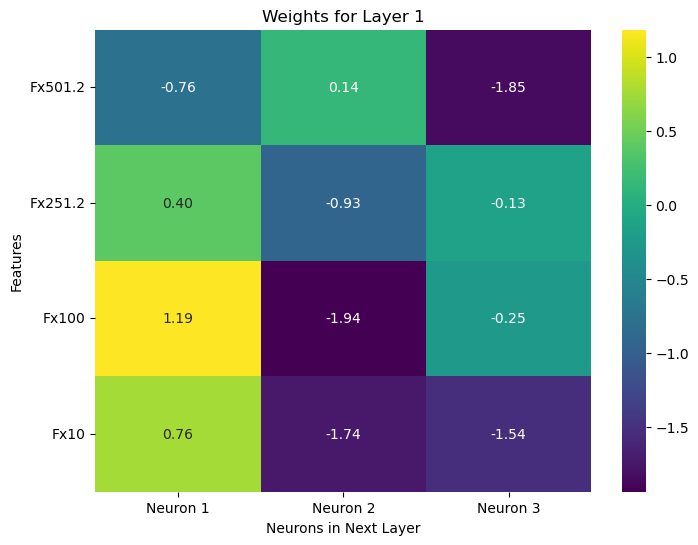

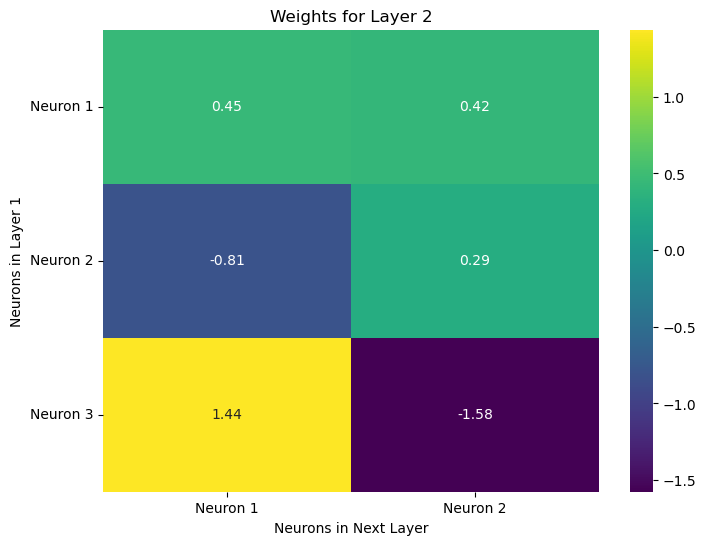

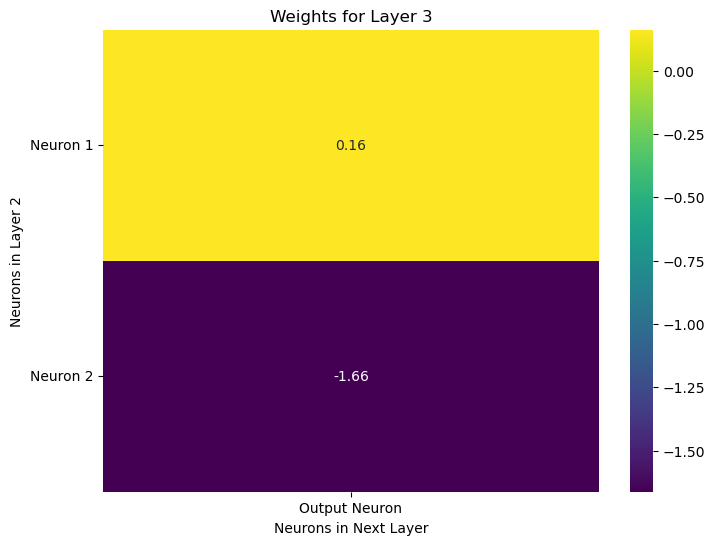

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 학습된 신경망 모델
nn_final_updated = NeuralNetwork(input_size=4, hidden_size1=3, hidden_size2=2, output_size=1)
nn_final_updated.train(X_train_normalized, y_train_normalized, epochs=20000)

# 특성 이름을 y축 레이블로 사용하기 위해 feature_names 변수 설정
feature_names = freq_columns_updated  # 예: ['Fx501.2', 'Fx251.2', 'Fx100', 'Fx10']

# Step 1: Define function to plot layer weights with feature names as labels
def plot_layer_weights(weights, layer_num, y_labels, x_labels):
    plt.figure(figsize=(8, 6))
    sns.heatmap(weights, annot=True, cmap="viridis", cbar=True, fmt=".2f")
    plt.title(f"Weights for Layer {layer_num}")
    plt.xlabel("Neurons in Next Layer")
    plt.ylabel("Features" if layer_num == 1 else f"Neurons in Layer {layer_num - 1}")
    
    # y축 레이블을 설정
    plt.yticks(ticks=np.arange(len(y_labels)) + 0.5, labels=y_labels, rotation=0)
    plt.xticks(ticks=np.arange(len(x_labels)) + 0.5, labels=x_labels, rotation=0)
    plt.show()

# Step 2: Define labels for each layer
layer1_y_labels = feature_names
layer1_x_labels = [f"Neuron {i+1}" for i in range(nn_final_updated.weights1.shape[1])]

layer2_y_labels = layer1_x_labels
layer2_x_labels = [f"Neuron {i+1}" for i in range(nn_final_updated.weights2.shape[1])]

layer3_y_labels = layer2_x_labels
layer3_x_labels = ["Output Neuron"]

# Step 3: Plot weights for each layer with feature names
# Layer 1 weights: input layer to first hidden layer
plot_layer_weights(nn_final_updated.weights1, 1, y_labels=layer1_y_labels, x_labels=layer1_x_labels)

# Layer 2 weights: first hidden layer to second hidden layer
plot_layer_weights(nn_final_updated.weights2, 2, y_labels=layer2_y_labels, x_labels=layer2_x_labels)

# Layer 3 weights: second hidden layer to output layer
plot_layer_weights(nn_final_updated.weights3, 3, y_labels=layer3_y_labels, x_labels=layer3_x_labels)
